# Deep Learning Approach to Crack Branching Problem

## Data Preprocessing

In [2]:
import matplotlib.pyplot as plt
from PIL import Image
import random
import numpy as np

In [ ]:
import os
import pandas as pd

input_dir = 'input'
output_dir = 'output'

# Get all input files ending in _0.jpeg
input_files = sorted([f for f in os.listdir(input_dir) if f.endswith('_0.jpeg')])

# Build the DataFrame
df = pd.DataFrame({
    'input_path': [os.path.join(input_dir, f) for f in input_files],
    'output_path': [os.path.join(output_dir, f.replace('_0.jpeg', '_900.jpeg')) for f in input_files]
})

df.head()

,input_path,output_path
0,input/20mm_14mm_0.jpeg,output/20mm_14mm_900.jpeg
1,input/20mm_16mm_0.jpeg,output/20mm_16mm_900.jpeg
2,input/20mm_18mm_0.jpeg,output/20mm_18mm_900.jpeg
3,input/20mm_20mm_0.jpeg,output/20mm_20mm_900.jpeg
4,input/20mm_22mm_0.jpeg,output/20mm_22mm_900.jpeg


In [4]:
def extract_notch_params(filename):
    """Extract notch length and position from filename"""
    # For filenames like "20mm_14mm_0.jpeg"
    parts = filename.split('_')
    
    # Extract the length (20mm -> 20)
    length = float(parts[0].replace('mm', ''))
    
    # Extract the position (14mm -> 14)
    position = float(parts[1].replace('mm', ''))
    
    return length, position

In [5]:
# Extract notch parameters for all input files and create a new DataFrame
notch_params = [extract_notch_params(os.path.basename(path)) for path in df['input_path']]
df_new = pd.DataFrame(notch_params, columns=['notch_length', 'notch_position'])
df_new.head()

,notch_length,notch_position
0,20.0,14.0
1,20.0,16.0
2,20.0,18.0
3,20.0,20.0
4,20.0,22.0


Display Sample Input-Output Pair

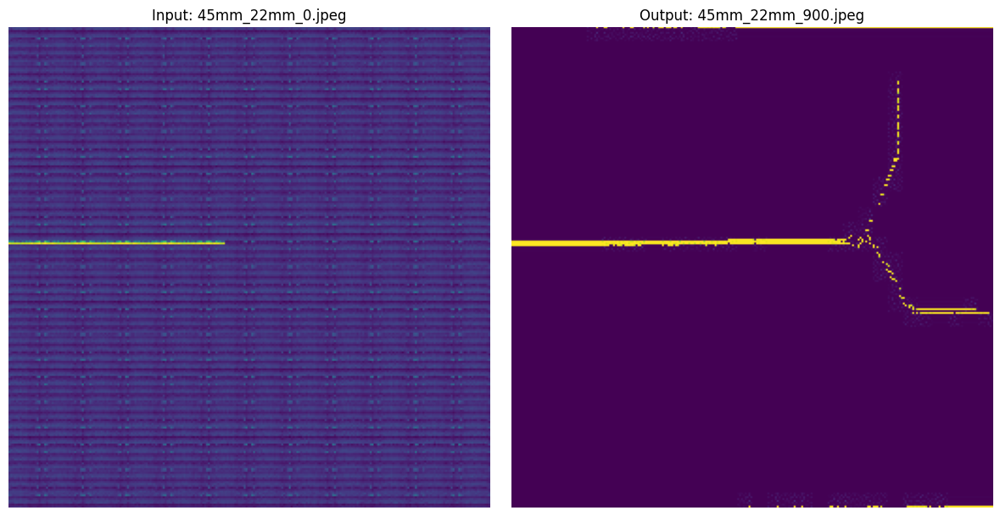

Displaying random image pair (40 of 49):
Input: input/45mm_22mm_0.jpeg
Output: output/45mm_22mm_900.jpeg


In [35]:
def display_random_image_pair(dataframe):
    """
    Display one random pair of input and output images side by side
    """
    if len(dataframe) == 0:
        print("No images found in the dataframe.")
        return
        
    # Select a random index
    random_idx = random.randint(0, len(dataframe) - 1)
    
    # Get the randomly selected image paths
    input_path = dataframe['input_path'].iloc[random_idx]
    output_path = dataframe['output_path'].iloc[random_idx]
    
    # Set up the figure for side-by-side display
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    # Display input image
    if os.path.exists(input_path):
        img_input = Image.open(input_path)
        axes[0].imshow(img_input)
        axes[0].set_title(f"Input: {os.path.basename(input_path)}")
        axes[0].axis('off')
    else:
        print(f"Warning: Input image {input_path} not found.")
    
    # Display output image if it exists
    if os.path.exists(output_path):
        img_output = Image.open(output_path)
        axes[1].imshow(img_output)
        axes[1].set_title(f"Output: {os.path.basename(output_path)}")
        axes[1].axis('off')
    else:
        print(f"Warning: Output image {output_path} not found. It may not have been generated yet.")
    
    plt.tight_layout()
    plt.show()
    
    print(f"Displaying random image pair ({random_idx + 1} of {len(dataframe)}):")
    print(f"Input: {input_path}")
    print(f"Output: {output_path}")

# Display one random image pair
display_random_image_pair(df)

### Convert Images to Grayscale

After grayscale formatting, converted all pixel values to 0 or 255 by applying a threshold of 128.

Analyzing and converting images to grayscale...
Image 1/49: 20mm_14mm_900.jpeg
  - Format: JPEG
  - Mode: L
  - Size: 256x256 pixels
  - Already in grayscale format, skipping conversion

Image 2/49: 20mm_16mm_900.jpeg
  - Format: JPEG
  - Mode: L
  - Size: 256x256 pixels
  - Already in grayscale format, skipping conversion

Image 3/49: 20mm_18mm_900.jpeg
  - Format: JPEG
  - Mode: L
  - Size: 256x256 pixels
  - Already in grayscale format, skipping conversion

Image 4/49: 20mm_20mm_900.jpeg
  - Format: JPEG
  - Mode: L
  - Size: 256x256 pixels
  - Already in grayscale format, skipping conversion

Image 5/49: 20mm_22mm_900.jpeg
  - Format: JPEG
  - Mode: L
  - Size: 256x256 pixels
  - Already in grayscale format, skipping conversion

Image 6/49: 20mm_24mm_900.jpeg
  - Format: JPEG
  - Mode: L
  - Size: 256x256 pixels
  - Already in grayscale format, skipping conversion

Image 7/49: 20mm_26mm_900.jpeg
  - Format: JPEG
  - Mode: L
  - Size: 256x256 pixels
  - Already in grayscale format, 

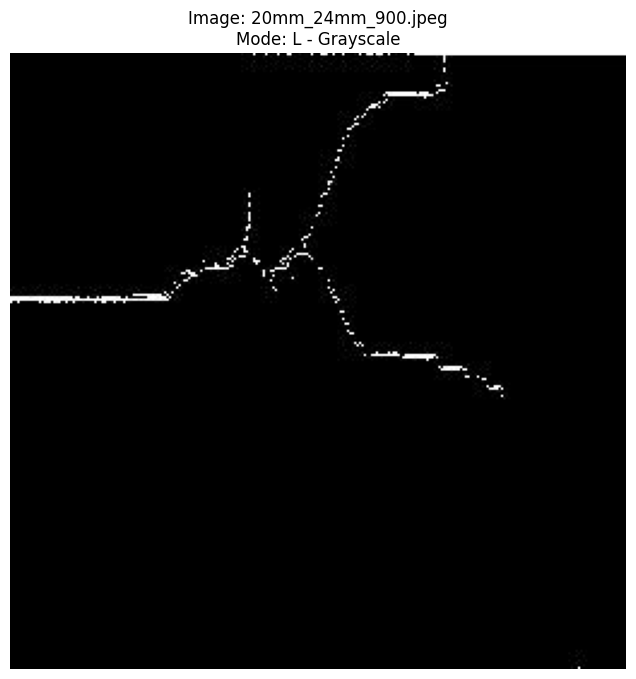

Displaying random image: output/20mm_24mm_900.jpeg
Format: JPEG
Mode: L
Size: 256x256 pixels
Is grayscale: True


In [7]:
output_files = sorted([f for f in os.listdir(output_dir) if f.endswith('_900.jpeg')])

def get_image_info(img):
    """
    Get detailed information about an image
    """
    info = {
        'mode': img.mode,
        'format': img.format if img.format else 'Unknown',
        'size': img.size,
        'is_grayscale': img.mode in ('L', '1', 'LA')
    }
    
    # Additional check for RGB/RGBA images that might actually be grayscale
    if img.mode in ('RGB', 'RGBA'):
        # Convert to numpy array
        img_array = np.array(img)
        
        # Check if all RGB channels are equal (true grayscale)
        if img.mode == 'RGB' and np.all(img_array[:,:,0] == img_array[:,:,1]) and np.all(img_array[:,:,0] == img_array[:,:,2]):
            info['effectively_grayscale'] = True
        elif img.mode == 'RGBA' and np.all(img_array[:,:,0] == img_array[:,:,1]) and np.all(img_array[:,:,0] == img_array[:,:,2]):
            info['effectively_grayscale'] = True
        else:
            info['effectively_grayscale'] = False
    
    return info

# Function to analyze and convert existing output images to grayscale
def convert_output_to_grayscale():
    """
    Analyze and convert output images to grayscale if needed
    """
    print("Analyzing and converting images to grayscale...")
    
    # Statistics counters
    stats = {
        'total': len(output_files),
        'already_grayscale': 0,
        'converted': 0,
        'errors': 0
    }
    
    for i, filename in enumerate(output_files):
        file_path = os.path.join(output_dir, filename)
        
        try:
            # Open the image
            img = Image.open(file_path)
            
            # Get image information
            img_info = get_image_info(img)
            
            print(f"Image {i+1}/{len(output_files)}: {filename}")
            print(f"  - Format: {img_info['format']}")
            print(f"  - Mode: {img_info['mode']}")
            print(f"  - Size: {img_info['size'][0]}x{img_info['size'][1]} pixels")
            
            # Check if already grayscale
            if img_info['is_grayscale']:
                print("  - Already in grayscale format, skipping conversion")
                stats['already_grayscale'] += 1
            elif img.mode in ('RGB', 'RGBA') and img_info.get('effectively_grayscale', False):
                print("  - RGB format but effectively grayscale (all channels equal)")
                print("  - Converting to proper grayscale format...")
                gray_img = img.convert('L')
                gray_img.save(file_path)
                stats['converted'] += 1
            else:
                print("  - Converting to grayscale...")
                gray_img = img.convert('L')
                gray_img.save(file_path)
                stats['converted'] += 1
                
            print("")  # Empty line for readability
            
        except Exception as e:
            print(f"Error processing {file_path}: {str(e)}")
            stats['errors'] += 1
    
    # Print summary
    print("\nConversion Summary:")
    print(f"Total images processed: {stats['total']}")
    print(f"Already grayscale: {stats['already_grayscale']}")
    print(f"Converted to grayscale: {stats['converted']}")
    print(f"Errors encountered: {stats['errors']}")
    print("Conversion complete!")

# Function to display a random grayscale image to verify
def display_random_grayscale():
    """
    Display one random grayscale image to verify the conversion
    """
    if not output_files:
        print("No images found.")
        return
        
    # Select a random file
    random_file = random.choice(output_files)
    file_path = os.path.join(output_dir, random_file)
    
    # Set up the figure
    plt.figure(figsize=(8, 8))
    
    # Display image if it exists
    if os.path.exists(file_path):
        img = Image.open(file_path)
        
        # Get image information
        img_info = get_image_info(img)
        
        plt.imshow(img, cmap='gray')  # Use grayscale colormap
        plt.title(f"Image: {random_file}\nMode: {img_info['mode']} - {'Grayscale' if img_info['is_grayscale'] else 'Color'}")
        plt.axis('off')
        plt.show()
        
        print(f"Displaying random image: {file_path}")
        print(f"Format: {img_info['format']}")
        print(f"Mode: {img_info['mode']}")
        print(f"Size: {img_info['size'][0]}x{img_info['size'][1]} pixels")
        print(f"Is grayscale: {img_info['is_grayscale']}")
        if 'effectively_grayscale' in img_info:
            print(f"Effectively grayscale: {img_info['effectively_grayscale']}")
    else:
        print(f"Warning: Image {file_path} not found.")

# Convert all existing output images to grayscale
convert_output_to_grayscale()

# Display one random image to verify the conversion
display_random_grayscale()


Samples of thresholded grayscale images of cracks

Number of pixels with value 255: 598
Thresholded pixel values for 20mm_14mm_900.jpeg:
All output images have been converted to binary format.


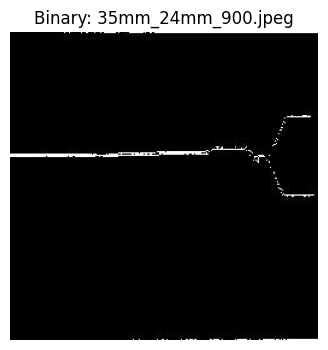

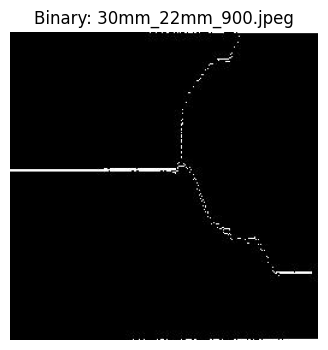

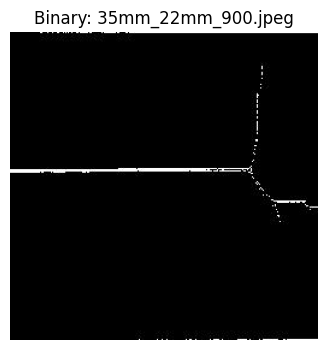

In [8]:
# Select a sample output image (e.g., the first one)
sample_output_path = os.path.join(output_dir, output_files[0])

# Open the image
img = Image.open(sample_output_path)

# Convert to numpy array
img_array = np.array(img)

# Apply thresholding: pixels >= 128 become 255, others become 0
threshold = 128
binary_img_array = np.where(img_array >= threshold, 255, 0).astype(np.uint8)
num_255 = np.sum(binary_img_array == 255)
print(f"Number of pixels with value 255: {num_255}")

# Print the thresholded pixel values
print(f"Thresholded pixel values for {output_files[0]}:")
# Convert all output images to binary (thresholded) format and save them
for filename in output_files:
    file_path = os.path.join(output_dir, filename)
    img = Image.open(file_path)
    img_array = np.array(img)
    binary_img_array = np.where(img_array >= threshold, 255, 0).astype(np.uint8)
    # Save the binary image back (overwrite)
    Image.fromarray(binary_img_array).save(file_path)

print("All output images have been converted to binary format.")

# Display a few sample binary images to verify
import matplotlib.pyplot as plt

num_samples = 3
sample_files = random.sample(output_files, min(num_samples, len(output_files)))

for fname in sample_files:
    path = os.path.join(output_dir, fname)
    img = Image.open(path)
    plt.figure(figsize=(4, 4))
    plt.imshow(img, cmap='gray')
    plt.title(f"Binary: {fname}")
    plt.axis('off')
    plt.show()

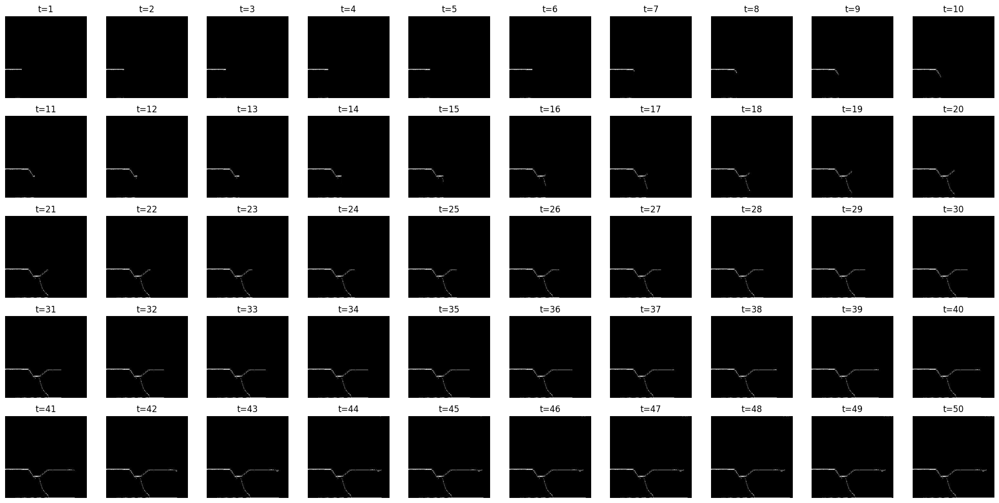

In [36]:
# Display a 5x10 grid of all 50 clipped images for a sample input

sample_idx = 0  # Change this index to select a different sample
clipped_dir = os.path.join(output_dir, "clipped")

plt.figure(figsize=(20, 10))
for t in range(1, 51):
    fname = df_new.iloc[sample_idx][f't={t}']
    img_path = os.path.join(clipped_dir, fname)
    img = Image.open(img_path)
    plt.subplot(5, 10, t)
    plt.imshow(img, cmap='gray')
    plt.title(f't={t}')
    plt.axis('off')
plt.tight_layout()
plt.show()

### Clipping

Clipping the images to obtain a progression of crack branching over 50 timesteps for each input-output pair

  0%|          | 0/49 [00:00<?, ?it/s]

100%|██████████| 49/49 [00:00<00:00, 60.44it/s]


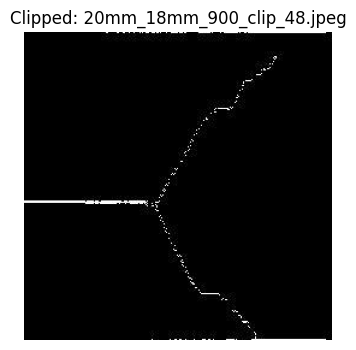

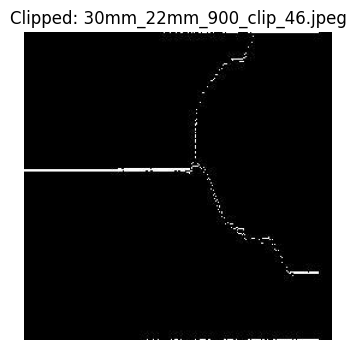

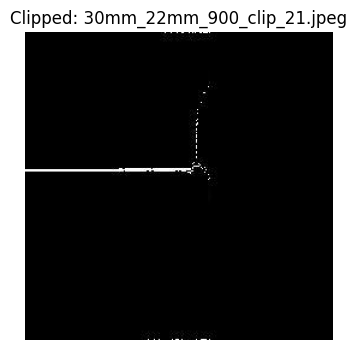

In [9]:
from tqdm import tqdm

# Create a directory to save the new images
clipped_dir = os.path.join(output_dir, "clipped")
os.makedirs(clipped_dir, exist_ok=True)

for idx, row in tqdm(df.iterrows(), total=len(df)):
    output_path = row['output_path']
    notch_length = df_new.loc[idx, 'notch_length']
    filename = os.path.basename(output_path)
    base_name = filename.replace('.jpeg', '')

    # Open the binary image
    img = Image.open(output_path)
    img_array = np.array(img)

    width = img_array.shape[1]

    # 50 evenly spaced points from notch_length to width-1
    x_points = np.linspace(notch_length*256/100, width-1, 50).astype(int)

    for i, x in enumerate(x_points):
        clipped = img_array.copy()
        clipped[:, x+1:] = 0  # Set all pixels to the right of x to zero

        out_name = f"{base_name}_clip_{i:02d}.jpeg"
        out_path = os.path.join(clipped_dir, out_name)
        Image.fromarray(clipped).save(out_path)
        
# Display a few sample clipped images to verify
sample_clipped_files = random.sample(os.listdir(clipped_dir), min(num_samples, len(os.listdir(clipped_dir))))
for fname in sample_clipped_files:
    path = os.path.join(clipped_dir, fname)
    img = Image.open(path)
    plt.figure(figsize=(4, 4))
    plt.imshow(img, cmap='gray')
    plt.title(f"Clipped: {fname}")
    plt.axis('off')
    plt.show()

In [10]:
# Add 50 columns t=1..50 to df_new, each corresponding to the clipped image filenames for each input-output pair
for t in range(1, 51):
    df_new[f't={t}'] = df.apply(
        lambda row: f"{os.path.splitext(os.path.basename(row['output_path']))[0]}_clip_{t-1:02d}.jpeg",
        axis=1
    )

df_new.head()

,notch_length,notch_position,t=1,t=2,t=3,t=4,t=5,t=6,t=7,t=8,...,t=41,t=42,t=43,t=44,t=45,t=46,t=47,t=48,t=49,t=50
0,20.0,14.0,20mm_14mm_900_clip_00.jpeg,20mm_14mm_900_clip_01.jpeg,20mm_14mm_900_clip_02.jpeg,20mm_14mm_900_clip_03.jpeg,20mm_14mm_900_clip_04.jpeg,20mm_14mm_900_clip_05.jpeg,20mm_14mm_900_clip_06.jpeg,20mm_14mm_900_clip_07.jpeg,...,20mm_14mm_900_clip_40.jpeg,20mm_14mm_900_clip_41.jpeg,20mm_14mm_900_clip_42.jpeg,20mm_14mm_900_clip_43.jpeg,20mm_14mm_900_clip_44.jpeg,20mm_14mm_900_clip_45.jpeg,20mm_14mm_900_clip_46.jpeg,20mm_14mm_900_clip_47.jpeg,20mm_14mm_900_clip_48.jpeg,20mm_14mm_900_clip_49.jpeg
1,20.0,16.0,20mm_16mm_900_clip_00.jpeg,20mm_16mm_900_clip_01.jpeg,20mm_16mm_900_clip_02.jpeg,20mm_16mm_900_clip_03.jpeg,20mm_16mm_900_clip_04.jpeg,20mm_16mm_900_clip_05.jpeg,20mm_16mm_900_clip_06.jpeg,20mm_16mm_900_clip_07.jpeg,...,20mm_16mm_900_clip_40.jpeg,20mm_16mm_900_clip_41.jpeg,20mm_16mm_900_clip_42.jpeg,20mm_16mm_900_clip_43.jpeg,20mm_16mm_900_clip_44.jpeg,20mm_16mm_900_clip_45.jpeg,20mm_16mm_900_clip_46.jpeg,20mm_16mm_900_clip_47.jpeg,20mm_16mm_900_clip_48.jpeg,20mm_16mm_900_clip_49.jpeg
2,20.0,18.0,20mm_18mm_900_clip_00.jpeg,20mm_18mm_900_clip_01.jpeg,20mm_18mm_900_clip_02.jpeg,20mm_18mm_900_clip_03.jpeg,20mm_18mm_900_clip_04.jpeg,20mm_18mm_900_clip_05.jpeg,20mm_18mm_900_clip_06.jpeg,20mm_18mm_900_clip_07.jpeg,...,20mm_18mm_900_clip_40.jpeg,20mm_18mm_900_clip_41.jpeg,20mm_18mm_900_clip_42.jpeg,20mm_18mm_900_clip_43.jpeg,20mm_18mm_900_clip_44.jpeg,20mm_18mm_900_clip_45.jpeg,20mm_18mm_900_clip_46.jpeg,20mm_18mm_900_clip_47.jpeg,20mm_18mm_900_clip_48.jpeg,20mm_18mm_900_clip_49.jpeg
3,20.0,20.0,20mm_20mm_900_clip_00.jpeg,20mm_20mm_900_clip_01.jpeg,20mm_20mm_900_clip_02.jpeg,20mm_20mm_900_clip_03.jpeg,20mm_20mm_900_clip_04.jpeg,20mm_20mm_900_clip_05.jpeg,20mm_20mm_900_clip_06.jpeg,20mm_20mm_900_clip_07.jpeg,...,20mm_20mm_900_clip_40.jpeg,20mm_20mm_900_clip_41.jpeg,20mm_20mm_900_clip_42.jpeg,20mm_20mm_900_clip_43.jpeg,20mm_20mm_900_clip_44.jpeg,20mm_20mm_900_clip_45.jpeg,20mm_20mm_900_clip_46.jpeg,20mm_20mm_900_clip_47.jpeg,20mm_20mm_900_clip_48.jpeg,20mm_20mm_900_clip_49.jpeg
4,20.0,22.0,20mm_22mm_900_clip_00.jpeg,20mm_22mm_900_clip_01.jpeg,20mm_22mm_900_clip_02.jpeg,20mm_22mm_900_clip_03.jpeg,20mm_22mm_900_clip_04.jpeg,20mm_22mm_900_clip_05.jpeg,20mm_22mm_900_clip_06.jpeg,20mm_22mm_900_clip_07.jpeg,...,20mm_22mm_900_clip_40.jpeg,20mm_22mm_900_clip_41.jpeg,20mm_22mm_900_clip_42.jpeg,20mm_22mm_900_clip_43.jpeg,20mm_22mm_900_clip_44.jpeg,20mm_22mm_900_clip_45.jpeg,20mm_22mm_900_clip_46.jpeg,20mm_22mm_900_clip_47.jpeg,20mm_22mm_900_clip_48.jpeg,20mm_22mm_900_clip_49.jpeg


Train-test Split

In [26]:
from sklearn.model_selection import train_test_split

# Split df_new into train and test sets, with 3 samples in the test set
df_train, df_test = train_test_split(df_new, test_size=3, random_state=42)

print("Train set size:", len(df_train))
print("Test set size:", len(df_test))
df_test.head()

Train set size: 46
Test set size: 3


,notch_length,notch_position,t=1,t=2,t=3,t=4,t=5,t=6,t=7,t=8,...,t=41,t=42,t=43,t=44,t=45,t=46,t=47,t=48,t=49,t=50
13,25.0,26.0,25mm_26mm_900_clip_00.jpeg,25mm_26mm_900_clip_01.jpeg,25mm_26mm_900_clip_02.jpeg,25mm_26mm_900_clip_03.jpeg,25mm_26mm_900_clip_04.jpeg,25mm_26mm_900_clip_05.jpeg,25mm_26mm_900_clip_06.jpeg,25mm_26mm_900_clip_07.jpeg,...,25mm_26mm_900_clip_40.jpeg,25mm_26mm_900_clip_41.jpeg,25mm_26mm_900_clip_42.jpeg,25mm_26mm_900_clip_43.jpeg,25mm_26mm_900_clip_44.jpeg,25mm_26mm_900_clip_45.jpeg,25mm_26mm_900_clip_46.jpeg,25mm_26mm_900_clip_47.jpeg,25mm_26mm_900_clip_48.jpeg,25mm_26mm_900_clip_49.jpeg
45,50.0,20.0,50mm_20mm_900_clip_00.jpeg,50mm_20mm_900_clip_01.jpeg,50mm_20mm_900_clip_02.jpeg,50mm_20mm_900_clip_03.jpeg,50mm_20mm_900_clip_04.jpeg,50mm_20mm_900_clip_05.jpeg,50mm_20mm_900_clip_06.jpeg,50mm_20mm_900_clip_07.jpeg,...,50mm_20mm_900_clip_40.jpeg,50mm_20mm_900_clip_41.jpeg,50mm_20mm_900_clip_42.jpeg,50mm_20mm_900_clip_43.jpeg,50mm_20mm_900_clip_44.jpeg,50mm_20mm_900_clip_45.jpeg,50mm_20mm_900_clip_46.jpeg,50mm_20mm_900_clip_47.jpeg,50mm_20mm_900_clip_48.jpeg,50mm_20mm_900_clip_49.jpeg
47,50.0,24.0,50mm_24mm_900_clip_00.jpeg,50mm_24mm_900_clip_01.jpeg,50mm_24mm_900_clip_02.jpeg,50mm_24mm_900_clip_03.jpeg,50mm_24mm_900_clip_04.jpeg,50mm_24mm_900_clip_05.jpeg,50mm_24mm_900_clip_06.jpeg,50mm_24mm_900_clip_07.jpeg,...,50mm_24mm_900_clip_40.jpeg,50mm_24mm_900_clip_41.jpeg,50mm_24mm_900_clip_42.jpeg,50mm_24mm_900_clip_43.jpeg,50mm_24mm_900_clip_44.jpeg,50mm_24mm_900_clip_45.jpeg,50mm_24mm_900_clip_46.jpeg,50mm_24mm_900_clip_47.jpeg,50mm_24mm_900_clip_48.jpeg,50mm_24mm_900_clip_49.jpeg


## Model

In [27]:
import os
import numpy as np
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F

# Parameters
sequence_length = 50
img_size = 256  # Assuming 256x256 images
batch_size = 4

# Custom dataset
class ClippedImageSequenceDataset(Dataset):
    def __init__(self, df, clipped_dir):
        self.df = df
        self.clipped_dir = clipped_dir

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # Load the sequence of images for this sample
        seq_imgs = []
        for t in range(1, sequence_length+1):
            fname = self.df.iloc[idx][f't={t}']
            img_path = os.path.join(self.clipped_dir, fname)
            img = Image.open(img_path)
            img_array = np.array(img).astype(np.float32) / 255.0  # Normalize
            seq_imgs.append(img_array.flatten())
        seq_imgs = np.stack(seq_imgs)  # Shape: (sequence_length, img_size*img_size)
        # Input: first (sequence_length-1), Target: next (sequence_length-1)
        return torch.tensor(seq_imgs[:-1]), torch.tensor(seq_imgs[1:])

# Define a simple LSTM model
class ImageSequenceLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_layers=1):
        super().__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, input_dim)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out)
        return out

# Custom Cosine Similarity Loss
class CosineSimilarityLoss(nn.Module):
    def __init__(self, dim=1, eps=1e-8, reduction='mean'):
        super().__init__()
        self.dim = dim
        self.eps = eps
        self.reduction = reduction
        
    def forward(self, x1, x2):
        # Compute cosine similarity
        cos_sim = F.cosine_similarity(x1, x2, dim=self.dim, eps=self.eps)
        
        # Convert similarity to a loss (1 - similarity)
        loss = 1 - cos_sim
        
        # Apply reduction
        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        else:  # 'none'
            return loss

# Combined loss function (MSE + Cosine Similarity)
class CombinedLoss(nn.Module):
    def __init__(self, alpha=0.5):
        super().__init__()
        self.mse_loss = nn.MSELoss()
        self.cosine_loss = CosineSimilarityLoss(dim=2)  # Set dim=2 for batch data
        self.alpha = alpha  # Weight for combining losses
        
    def forward(self, outputs, targets):
        mse = self.mse_loss(outputs, targets)
        cosine = self.cosine_loss(outputs, targets)
        # Combine losses (alpha controls the balance)
        return self.alpha * mse + (1 - self.alpha) * cosine

def train_model(model, dataloader, criterion, optimizer, num_epochs=5):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    
    model = model.to(device)
    losses = []
    
    for epoch in range(num_epochs):
        model.train()
        epoch_loss = 0.0
        batch_count = 0
        
        for batch_inputs, batch_targets in dataloader:
            batch_inputs = batch_inputs.to(device)
            batch_targets = batch_targets.to(device)
            
            # Forward pass
            outputs = model(batch_inputs)
            
            # Compute loss
            loss = criterion(outputs, batch_targets)
            
            # Backward and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item()
            batch_count += 1
            
            if batch_count % 10 == 0:
                print(f"Epoch {epoch+1}/{num_epochs}, Batch {batch_count}, Loss: {loss.item():.4f}")
        
        avg_loss = epoch_loss / batch_count
        losses.append(avg_loss)
        print(f"Epoch {epoch+1}/{num_epochs}, Average Loss: {avg_loss:.4f}")
    
    return losses

def main():
    # Setup dataset and dataloader
    output_dir = 'output'  # Change if your output directory is different
    clipped_dir = os.path.join(output_dir, "clipped")
    
    # Use df_train for training
    try:
        dataloader = DataLoader(ClippedImageSequenceDataset(df_train, clipped_dir), 
                                batch_size=batch_size, shuffle=True)
    except NameError:
        print("Warning: df_train not found. This code assumes you have a DataFrame with image paths.")
        print("Please define df_train before running this code.")
        return
    
    # Model parameters
    input_dim = img_size * img_size
    hidden_dim = 512
    
    # Initialize the model, loss function, and optimizer
    model = ImageSequenceLSTM(input_dim, hidden_dim)
    
    # Choose one of these loss functions:
    # Option 1: Pure Cosine Similarity Loss
    # criterion = CosineSimilarityLoss(dim=2)
    # Option 2: Combined MSE and Cosine Similarity Loss
    criterion = CombinedLoss(alpha=0.3)  # 30% MSE, 70% Cosine Similarity
    
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    
    # Train the model
    train_model(model, dataloader, criterion, optimizer, num_epochs=200)
    
    # Save the model
    torch.save(model.state_dict(), os.path.join(output_dir, "image_sequence_model.pth"))
    print(f"Model saved to {os.path.join(output_dir, 'image_sequence_model.pth')}")

if __name__ == "__main__":
    main()


Using device: cpu
Epoch 1/200, Batch 10, Loss: 0.4256
Epoch 1/200, Average Loss: 0.5765
Epoch 2/200, Batch 10, Loss: 0.3203
Epoch 2/200, Average Loss: 0.3348
Epoch 3/200, Batch 10, Loss: 0.1562
Epoch 3/200, Average Loss: 0.2305
Epoch 4/200, Batch 10, Loss: 0.1591
Epoch 4/200, Average Loss: 0.1986
Epoch 5/200, Batch 10, Loss: 0.2230
Epoch 5/200, Average Loss: 0.1918
Epoch 6/200, Batch 10, Loss: 0.2110
Epoch 6/200, Average Loss: 0.1731
Epoch 7/200, Batch 10, Loss: 0.1635
Epoch 7/200, Average Loss: 0.1651
Epoch 8/200, Batch 10, Loss: 0.1364
Epoch 8/200, Average Loss: 0.1519
Epoch 9/200, Batch 10, Loss: 0.1313
Epoch 9/200, Average Loss: 0.1423
Epoch 10/200, Batch 10, Loss: 0.1445
Epoch 10/200, Average Loss: 0.1309
Epoch 11/200, Batch 10, Loss: 0.1300
Epoch 11/200, Average Loss: 0.1355
Epoch 12/200, Batch 10, Loss: 0.1152
Epoch 12/200, Average Loss: 0.1277
Epoch 13/200, Batch 10, Loss: 0.1131
Epoch 13/200, Average Loss: 0.1238
Epoch 14/200, Batch 10, Loss: 0.1274
Epoch 14/200, Average Loss:

### Testing

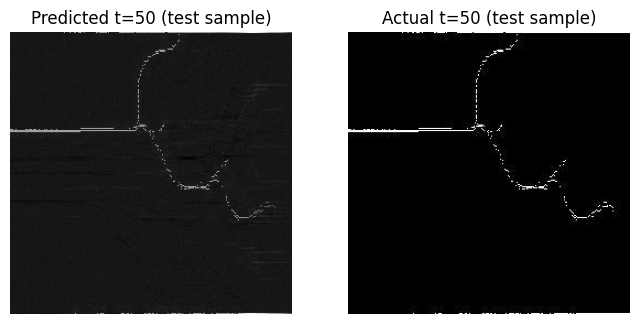

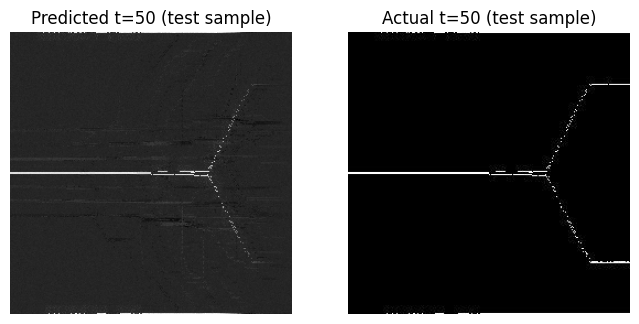

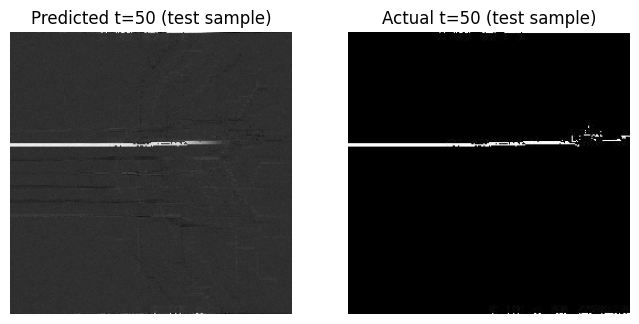

In [33]:
# Predict t=50 for all test samples given only t=1 as input, and compare with ground truth

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
clipped_dir = os.path.join(output_dir, "clipped")

for idx, row in df_test.iterrows():
    # Load the sequence of images for this sample
    input_sequence = []
    for t in range(1, sequence_length + 1):
        fname = row[f't={t}']
        img_path = os.path.join(clipped_dir, fname)
        img = Image.open(img_path)
        img_array = np.array(img).astype(np.float32) / 255.0  # Normalize
        input_sequence.append(img_array.flatten())
    input_sequence = np.stack(input_sequence)  # (sequence_length, img_size*img_size)

    # Prepare the initial input (t=1)
    input_seq = input_sequence[0:1]  # Shape: (1, img_size*img_size)
    input_seq_torch = torch.tensor(input_seq).unsqueeze(0).to(device)  # (1, 1, img_size*img_size)

    # Predict up to t=50
    pred = input_seq[0]
    hidden = None
    for step in range(1, 50):
        with torch.no_grad():
            out, hidden = model.lstm(input_seq_torch, hidden)
            pred = model.fc(out[:, -1, :])
            input_seq_torch = pred.unsqueeze(1)
    pred_img = pred.cpu().numpy().squeeze()

    # Show predicted and actual t=50 images side by side
    plt.figure(figsize=(8, 4))
    # Predicted
    plt.subplot(1, 2, 1)
    plt.imshow(pred_img.reshape(img_size, img_size), cmap='gray')
    plt.title(f'Predicted t=50 (test sample)')
    plt.axis('off')
    # Actual
    plt.subplot(1, 2, 2)
    plt.imshow(input_sequence[49].reshape(img_size, img_size), cmap='gray')
    plt.title(f'Actual t=50 (test sample)')
    plt.axis('off')
    plt.show()


### Progressive predictions for an input

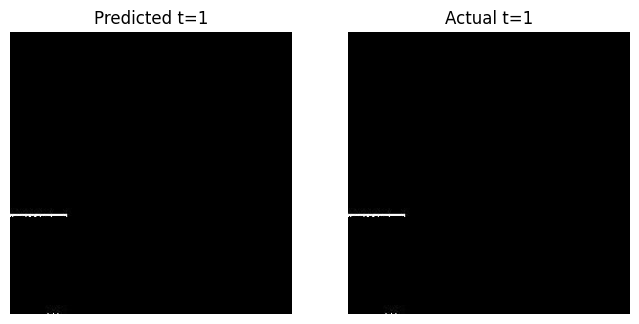

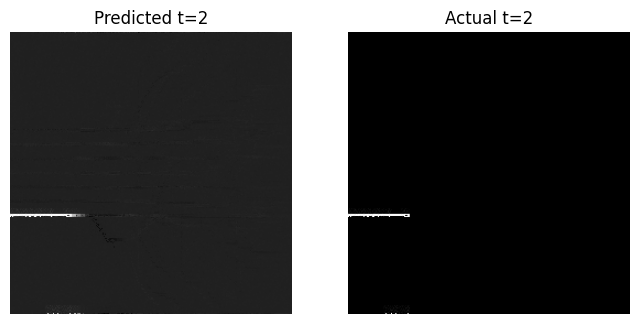

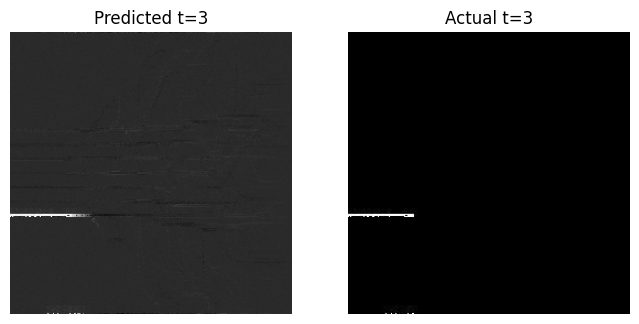

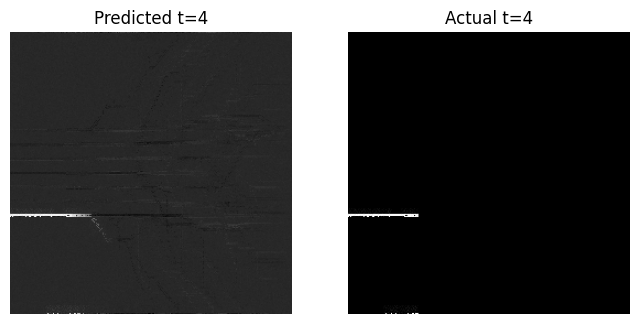

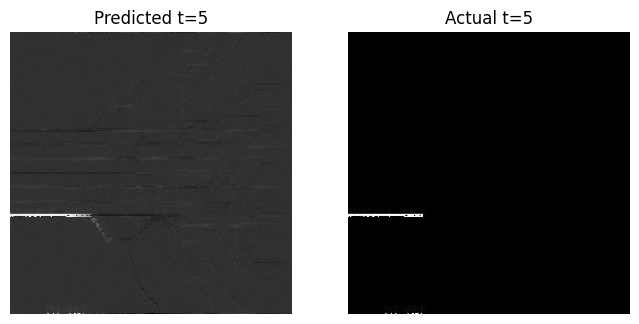

...

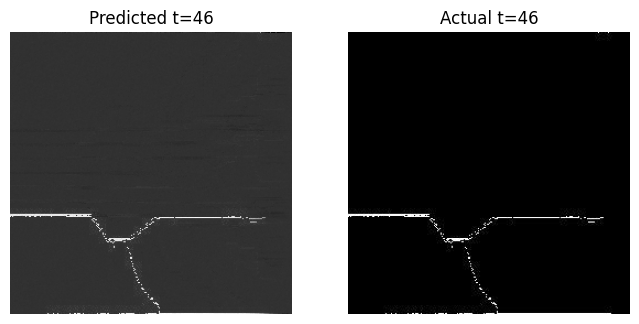

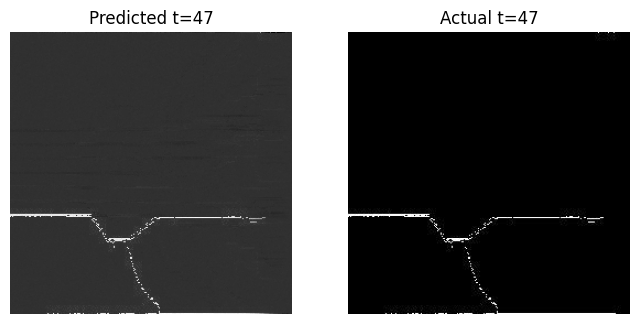

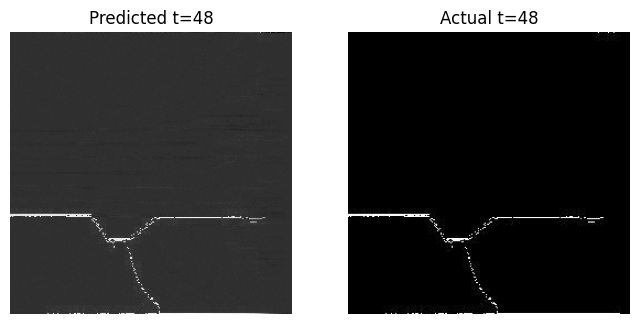

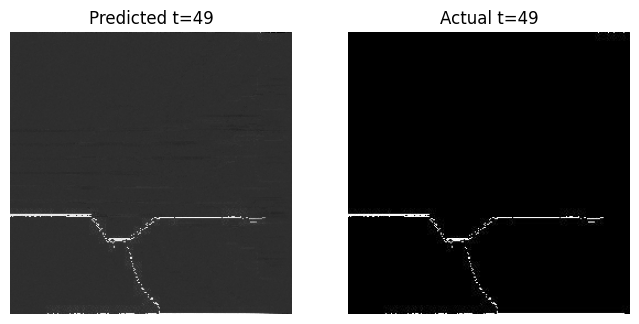

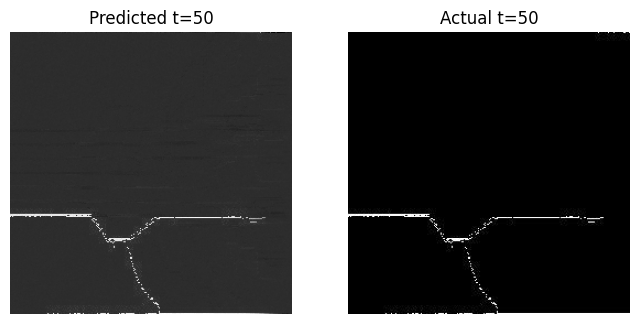

In [31]:
# Start with an input image at t=1 and make predictions up to t=50
# Also show the actual images on the right at each time step

# Select a sample from the dataset (e.g., the first row)
sample_idx = 0
clipped_dir = os.path.join(output_dir, "clipped")

# Load the sequence of images for this sample
input_sequence = []
for t in range(1, sequence_length + 1):
    fname = df_new.iloc[sample_idx][f't={t}']
    img_path = os.path.join(clipped_dir, fname)
    img = Image.open(img_path)
    img_array = np.array(img).astype(np.float32) / 255.0  # Normalize
    input_sequence.append(img_array.flatten())
input_sequence = np.stack(input_sequence)  # (sequence_length, img_size*img_size)

# Prepare the initial input (t=1)
input_seq = input_sequence[0:1]  # Shape: (1, img_size*img_size)
input_seq_torch = torch.tensor(input_seq).unsqueeze(0)  # Shape: (1, 1, img_size*img_size)

# Set model to eval mode and move to correct device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
input_seq_torch = input_seq_torch.to(device)

# Predict up to t=50
predictions = [input_seq[0]]  # Start with t=1 input
hidden = None
for step in range(1, 50):
    with torch.no_grad():
        out, hidden = model.lstm(input_seq_torch, hidden)
        pred = model.fc(out[:, -1, :])  # (1, input_dim)
        predictions.append(pred.cpu().numpy().squeeze())
        input_seq_torch = pred.unsqueeze(1)

# Visualize the predictions and actual images side by side
for t in range(0, 50):
    plt.figure(figsize=(8, 4))
    # Predicted
    plt.subplot(1, 2, 1)
    plt.imshow(predictions[t].reshape(img_size, img_size), cmap='gray')
    plt.title(f'Predicted t={t+1}')
    plt.axis('off')
    # Actual
    plt.subplot(1, 2, 2)
    plt.imshow(input_sequence[t].reshape(img_size, img_size), cmap='gray')
    plt.title(f'Actual t={t+1}')
    plt.axis('off')
    plt.show()


### Predictions for all inputs

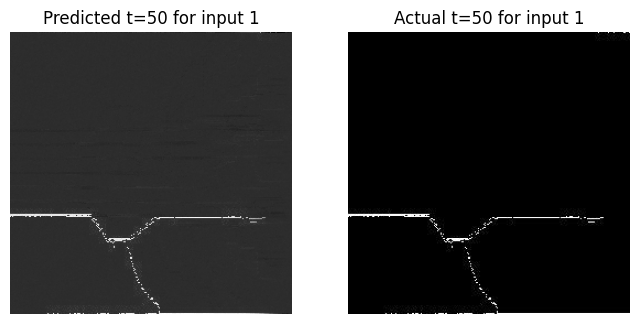

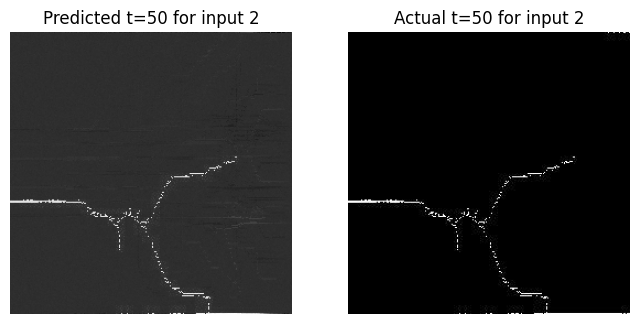

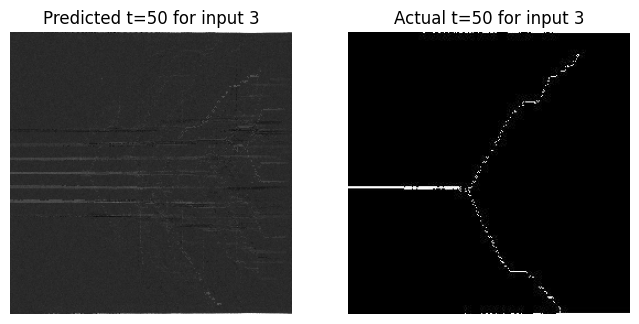

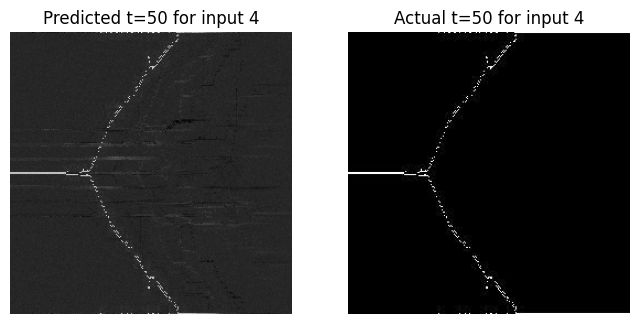

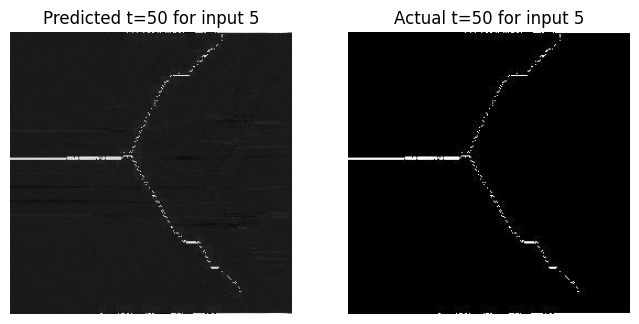

...

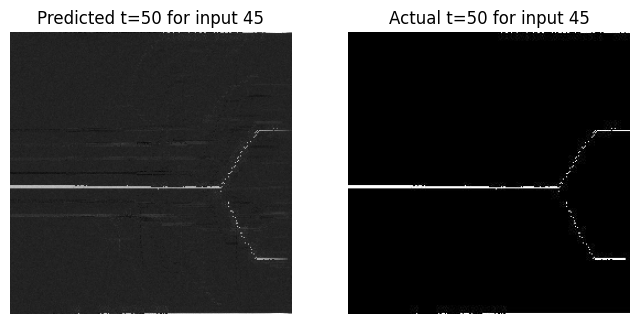

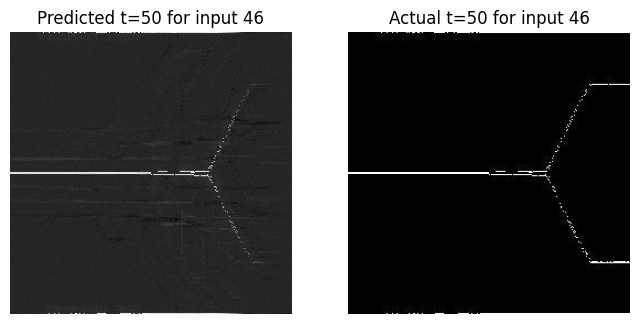

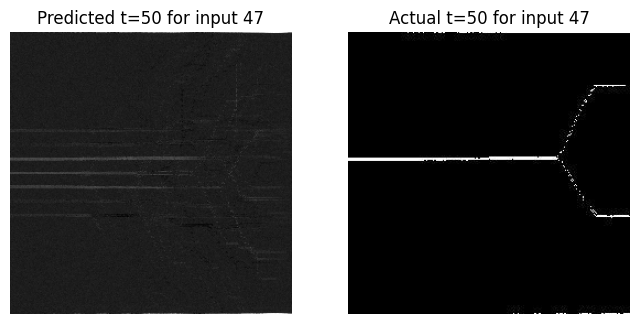

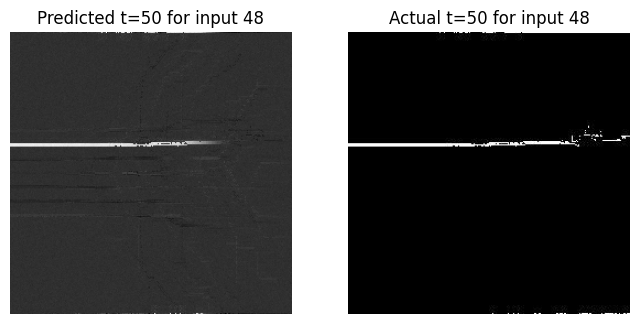

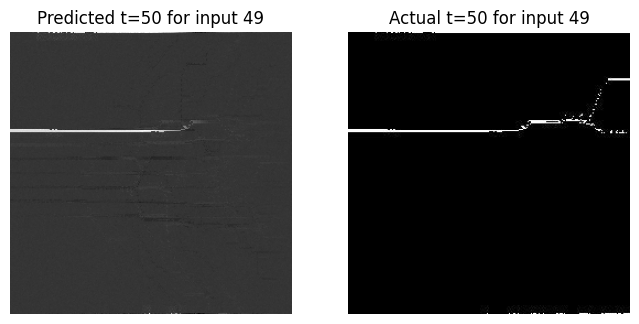

In [32]:
# Predict t=50 for all inputs and print the predicted and actual t=50 image output for each

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
clipped_dir = os.path.join(output_dir, "clipped")

for sample_idx in range(len(df_new)):
    # Load the sequence of images for this sample
    input_sequence = []
    for t in range(1, sequence_length + 1):
        fname = df_new.iloc[sample_idx][f't={t}']
        img_path = os.path.join(clipped_dir, fname)
        img = Image.open(img_path)
        img_array = np.array(img).astype(np.float32) / 255.0  # Normalize
        input_sequence.append(img_array.flatten())
    input_sequence = np.stack(input_sequence)  # (sequence_length, img_size*img_size)

    # Prepare the initial input (t=1)
    input_seq = input_sequence[0:1]  # Shape: (1, img_size*img_size)
    input_seq_torch = torch.tensor(input_seq).unsqueeze(0).to(device)  # (1, 1, img_size*img_size)

    # Predict up to t=50
    predictions = [input_seq[0]]
    hidden = None
    for step in range(1, 50):
        with torch.no_grad():
            out, hidden = model.lstm(input_seq_torch, hidden)
            pred = model.fc(out[:, -1, :])
            predictions.append(pred.cpu().numpy().squeeze())
            input_seq_torch = pred.unsqueeze(1)

    # Show predicted and actual t=50 images side by side
    plt.figure(figsize=(8, 4))
    # Predicted
    plt.subplot(1, 2, 1)
    plt.imshow(predictions[49].reshape(img_size, img_size), cmap='gray')
    plt.title(f'Predicted t=50 for input {sample_idx+1}')
    plt.axis('off')
    # Actual
    plt.subplot(1, 2, 2)
    plt.imshow(input_sequence[49].reshape(img_size, img_size), cmap='gray')
    plt.title(f'Actual t=50 for input {sample_idx+1}')
    plt.axis('off')
    plt.show()